# Loan Approval Prediction

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")
import warnings
warnings.filterwarnings('ignore')

# Data Loading

In [2]:
df = pd.read_csv(r"D:\course\Courses\depi final project\credit card detection dataset .csv")
print(df.head())

   person_age person_gender person_education  person_income  person_emp_exp  \
0        22.0        female           Master        71948.0               0   
1        21.0        female      High School        12282.0               0   
2        25.0        female      High School        12438.0               3   
3        23.0        female         Bachelor        79753.0               0   
4        24.0          male           Master        66135.0               1   

  person_home_ownership  loan_amnt loan_intent  loan_int_rate  \
0                  RENT    35000.0    PERSONAL          16.02   
1                   OWN     1000.0   EDUCATION          11.14   
2              MORTGAGE     5500.0     MEDICAL          12.87   
3                  RENT    35000.0     MEDICAL          15.23   
4                  RENT    35000.0     MEDICAL          14.27   

   loan_percent_income  cb_person_cred_hist_length  credit_score  \
0                 0.49                         3.0           561  

# Data Exploration

In [3]:
df.shape

(45000, 14)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_age                      45000 non-null  float64
 1   person_gender                   45000 non-null  object 
 2   person_education                45000 non-null  object 
 3   person_income                   45000 non-null  float64
 4   person_emp_exp                  45000 non-null  int64  
 5   person_home_ownership           45000 non-null  object 
 6   loan_amnt                       45000 non-null  float64
 7   loan_intent                     45000 non-null  object 
 8   loan_int_rate                   45000 non-null  float64
 9   loan_percent_income             45000 non-null  float64
 10  cb_person_cred_hist_length      45000 non-null  float64
 11  credit_score                    45000 non-null  int64  
 12  previous_loan_defaults_on_file  

In [5]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
person_age,45000.000000,27.764178,6.045108,20.000000,24.000000,26.000000,30.000000,144.000000
person_income,45000.000000,80319.053222,80422.498632,8000.000000,47204.000000,67048.000000,95789.250000,7200766.000000
person_emp_exp,45000.000000,5.410333,6.063532,0.000000,1.000000,4.000000,8.000000,125.000000
loan_amnt,45000.000000,9583.157556,6314.886691,500.000000,5000.000000,8000.000000,12237.250000,35000.000000
loan_int_rate,45000.000000,11.006606,2.978808,5.420000,8.590000,11.010000,12.990000,20.000000
loan_percent_income,45000.000000,0.139725,0.087212,0.000000,0.070000,0.120000,0.190000,0.660000
cb_person_cred_hist_length,45000.000000,5.867489,3.879702,2.000000,3.000000,4.000000,8.000000,30.000000
credit_score,45000.000000,632.608756,50.435865,390.000000,601.000000,640.000000,670.000000,850.000000
loan_status,45000.000000,0.222222,0.415744,0.000000,0.000000,0.000000,0.000000,1.000000


# Data Cleaning & Preprocessing

In [6]:
df.duplicated().sum()

0

In [7]:
summary_info = pd.DataFrame({'Dtypes': df.dtypes, 'Nuique': df.nunique(), 'Null_Ratio': round(df.isnull().sum() / len(df) * 1000,2)})
summary_info

,Dtypes,Nuique,Null_Ratio
person_age,float64,60,0.0
person_gender,object,2,0.0
person_education,object,5,0.0
person_income,float64,33989,0.0
person_emp_exp,int64,63,0.0
person_home_ownership,object,4,0.0
loan_amnt,float64,4483,0.0
loan_intent,object,6,0.0
loan_int_rate,float64,1302,0.0
loan_percent_income,float64,64,0.0


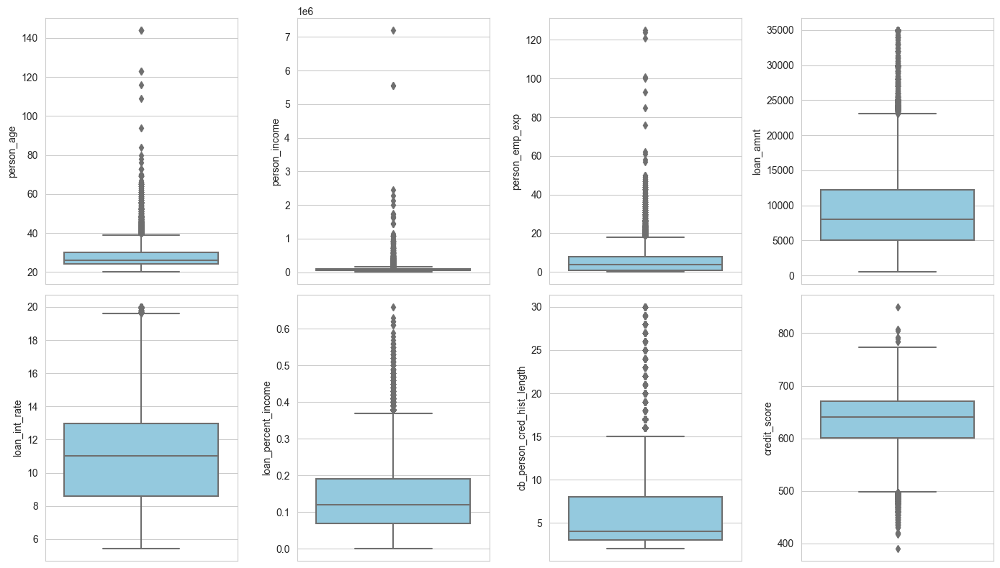

In [8]:
# check outliers
numeric_cols = df.drop('loan_status',axis=1).select_dtypes(include=np.number).columns
plt.figure(figsize=(14,8))
for i,col in enumerate(numeric_cols):
    plt.subplot(2,4,i+1)
    sns.boxplot(data=df,y=col,color='skyblue')
plt.tight_layout()
plt.show()

In [9]:
# Standardize text formatting
object_cols = df.select_dtypes(include='object')
for col in object_cols:
    df[col] = df[col].str.title()

In [10]:
# check outliers in object columns
df['person_home_ownership'].value_counts()

person_home_ownership
Rent        23443
Mortgage    18489
Own          2951
Other         117
Name: count, dtype: int64

In [11]:
# Handle categorical value inconsistencies
df = df.replace({'person_home_ownership': {'Other': 'Rent'}})

In [12]:
# Feature Engineering: Creating new features based on domain knowledge
df['income_emp_ratio'] = df['person_income'] / (df['person_emp_exp'] + 1)
df['emp_stability'] = df['person_emp_exp'] / (df['person_age'] + 1)

In [13]:
### feature show how related age by loan amount
df['age_loan_ratio'] = df['person_age'] / (df['loan_amnt'] + 1)
df['income_loan_ratio'] = df['person_income'] / (df['loan_amnt'] + 1)
# Age-Related Credit History
df['age_related_credit_hist'] = df['cb_person_cred_hist_length'] / df['person_age']
df['interest_burden'] = df['loan_int_rate'] * df['loan_amnt'] #interest_burden = loan_int_rate * loan_amnt


In [14]:
age_bins = [18, 25, 35, 50, 65]
age_labels = ['18-25', '26-35', '36-50', '51-65']
df['age_group'] = pd.cut(df['person_age'], bins=age_bins, labels=age_labels)

In [15]:
df['credit_score_group'] = pd.cut(df['credit_score'], bins=[0, 580, 670, 740, 800, 850], 
                                labels=['Poor', 'Fair', 'Good', 'Very Good', 'Excellent'])

In [16]:
df['loan_risk_category'] = pd.cut(df['loan_int_rate'], bins=[0, 10, 15, 20], 
                                    labels=['Low Risk', 'Medium Risk', 'High Risk'])

In [17]:
income_bins = [0, 30000, 60000, 90000, 120000, float('inf')]
income_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
df['income_group'] = pd.cut(df['person_income'], bins=income_bins, labels=income_labels)

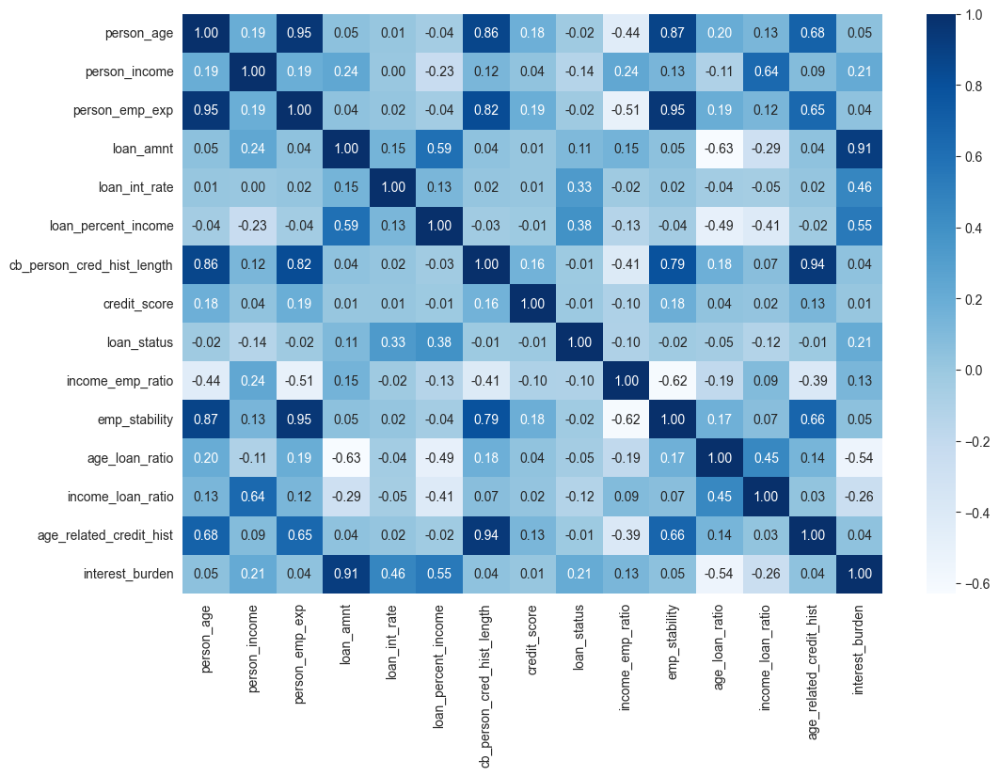

In [18]:
# show correlations between the features
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(numeric_only=True),annot=True,fmt='.2f',cmap='Blues')
plt.show()

In [19]:
# drop irrelevant features
df.drop(columns=['person_emp_exp'],axis=1,inplace=True)

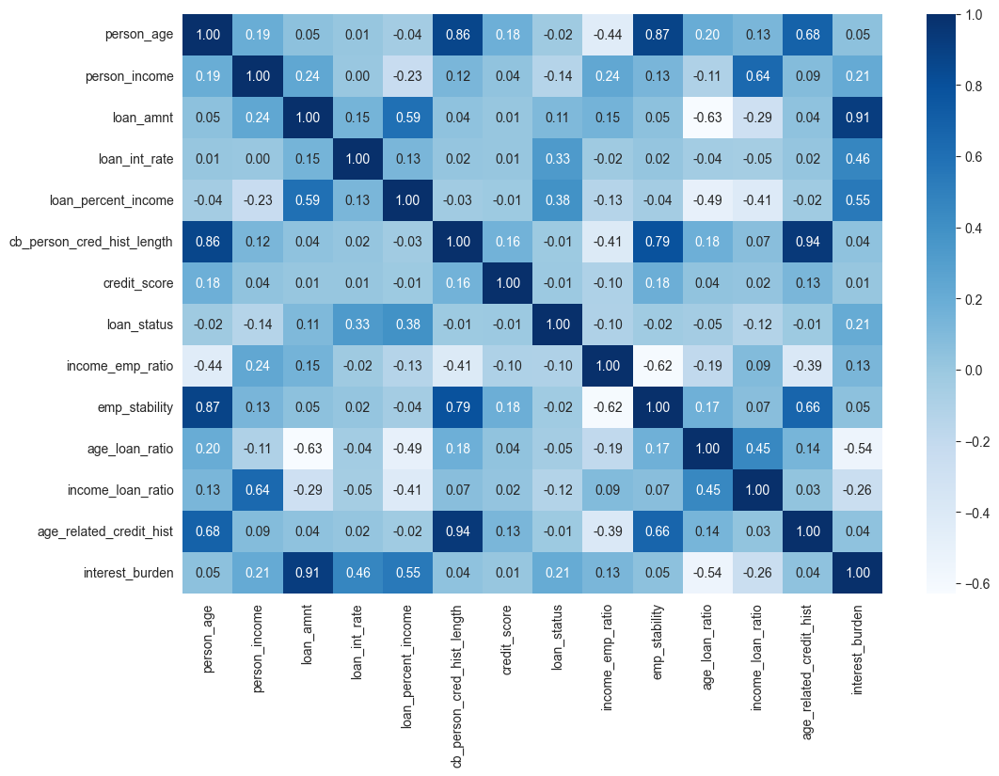

In [20]:
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(numeric_only=True),annot=True,fmt='.2f',cmap='Blues')
plt.show()

In [21]:
df

,person_age,person_gender,person_education,person_income,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,...,income_emp_ratio,emp_stability,age_loan_ratio,income_loan_ratio,age_related_credit_hist,interest_burden,age_group,credit_score_group,loan_risk_category,income_group
0,22.0,Female,Master,71948.0,Rent,35000.0,Personal,16.02,0.49,3.0,...,71948.000000,0.000000,0.000629,2.055598,0.136364,560700.00,18-25,Poor,High Risk,Medium
1,21.0,Female,High School,12282.0,Own,1000.0,Education,11.14,0.08,2.0,...,12282.000000,0.000000,0.020979,12.269730,0.095238,11140.00,18-25,Poor,Medium Risk,Very Low
2,25.0,Female,High School,12438.0,Mortgage,5500.0,Medical,12.87,0.44,3.0,...,3109.500000,0.115385,0.004545,2.261043,0.120000,70785.00,18-25,Fair,Medium Risk,Very Low
3,23.0,Female,Bachelor,79753.0,Rent,35000.0,Medical,15.23,0.44,2.0,...,79753.000000,0.000000,0.000657,2.278592,0.086957,533050.00,18-25,Good,High Risk,Medium
4,24.0,Male,Master,66135.0,Rent,35000.0,Medical,14.27,0.53,4.0,...,33067.500000,0.040000,0.000686,1.889517,0.166667,499450.00,18-25,Fair,Medium Risk,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,27.0,Male,Associate,47971.0,Rent,15000.0,Medical,15.66,0.31,3.0,...,6853.000000,0.214286,0.001800,3.197853,0.111111,234900.00,26-35,Fair,High Risk,Low
44996,37.0,Female,Associate,65800.0,Rent,9000.0,Homeimprovement,14.07,0.14,11.0,...,3655.555556,0.447368,0.004111,7.310299,0.297297,126630.00,36-50,Fair,Medium Risk,Medium
44997,33.0,Male,Associate,56942.0,Rent,2771.0,Debtconsolidation,10.02,0.05,10.0,...,7117.750000,0.205882,0.011905,20.541847,0.303030,27765.42,26-35,Fair,Medium Risk,Low
44998,29.0,Male,Bachelor,33164.0,Rent,12000.0,Education,13.23,0.36,6.0,...,6632.800000,0.133333,0.002416,2.763436,0.206897,158760.00,26-35,Fair,Medium Risk,Low


In [22]:
### calulate chisqaure between categorical features and target
from scipy.stats import chi2_contingency
categorical_cols = df.select_dtypes(include='object').columns
for col in categorical_cols:
    contingency_table = pd.crosstab(df[col], df['loan_status'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-square test for {col}: p-value = {p}")
    if p < 0.05:
        print(f"{col} is significantly associated with loan_status")
    else:
        print(f"{col} is NOT significantly associated with loan_status")    

Chi-square test for person_gender: p-value = 0.9142540404277906
person_gender is NOT significantly associated with loan_status
Chi-square test for person_education: p-value = 0.732826935503778
person_education is NOT significantly associated with loan_status
Chi-square test for person_home_ownership: p-value = 0.0
person_home_ownership is significantly associated with loan_status
Chi-square test for loan_intent: p-value = 2.173084187054017e-194
loan_intent is significantly associated with loan_status
Chi-square test for previous_loan_defaults_on_file: p-value = 0.0
previous_loan_defaults_on_file is significantly associated with loan_status


In [23]:
categorical_cols = df.select_dtypes(include='category').columns
for col in categorical_cols:
    contingency_table = pd.crosstab(df[col], df['loan_status'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-square test for {col}: p-value = {p}")
    if p < 0.05:
        print(f"{col} is significantly associated with loan_status")
    else:
        print(f"{col} is NOT significantly associated with loan_status")  

Chi-square test for age_group: p-value = 7.877207690639982e-08
age_group is significantly associated with loan_status
Chi-square test for credit_score_group: p-value = 0.39293460995334084
credit_score_group is NOT significantly associated with loan_status
Chi-square test for loan_risk_category: p-value = 0.0
loan_risk_category is significantly associated with loan_status
Chi-square test for income_group: p-value = 0.0
income_group is significantly associated with loan_status


In [24]:
#calculate VIF to check multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
X = df.select_dtypes(include=np.number)
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
vif_data

,Feature,VIF
0,person_age,161.415646
1,person_income,8.261871
2,loan_amnt,59.333959
3,loan_int_rate,43.722163
4,loan_percent_income,10.406818
5,cb_person_cred_hist_length,83.970206
6,credit_score,106.303016
7,loan_status,1.765451
8,income_emp_ratio,4.275040
9,emp_stability,14.275293


In [25]:
df.drop(columns=['cb_person_cred_hist_length'],axis=1,inplace=True)

In [26]:
## Anova test for numerical features
from scipy.stats import f_oneway
numerical_cols = df.select_dtypes(include=np.number).columns.drop('loan_status')
for col in numerical_cols:
    groups = [df[df['loan_status'] == status][col] for status in df['loan_status'].unique()]
    f_stat, p_value = f_oneway(*groups)
    print(f"ANOVA test for {col}: p-value = {p_value}")
    if p_value < 0.05:
        print(f"{col} is significantly associated with loan_status")
    else:
        print(f"{col} is NOT significantly associated with loan_status")

ANOVA test for person_age: p-value = 5.20977352158707e-06
person_age is significantly associated with loan_status
ANOVA test for person_income: p-value = 3.483099416838462e-184
person_income is significantly associated with loan_status
ANOVA test for loan_amnt: p-value = 3.236704416173408e-116
loan_amnt is significantly associated with loan_status
ANOVA test for loan_int_rate: p-value = 0.0
loan_int_rate is significantly associated with loan_status
ANOVA test for loan_percent_income: p-value = 0.0
loan_percent_income is significantly associated with loan_status
ANOVA test for credit_score: p-value = 0.1047627305070617
credit_score is NOT significantly associated with loan_status
ANOVA test for income_emp_ratio: p-value = 2.1296679615113927e-105
income_emp_ratio is significantly associated with loan_status
ANOVA test for emp_stability: p-value = 2.17690539046393e-07
emp_stability is significantly associated with loan_status
ANOVA test for age_loan_ratio: p-value = 1.3594875440576224e-22

# Data Visulaization

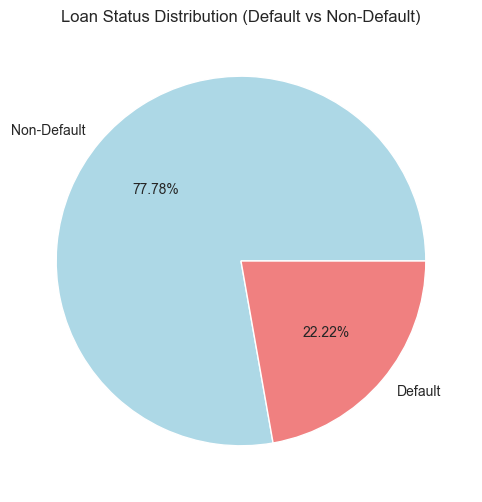

In [27]:
# Target variable distribution
plt.figure(figsize=(8, 6))
loan_status_counts = df['loan_status'].value_counts()
plt.pie(loan_status_counts, labels=['Non-Default', 'Default'], autopct='%1.2f%%', 
        colors=['lightblue', 'lightcoral'])
plt.title('Loan Status Distribution (Default vs Non-Default)')
plt.show()

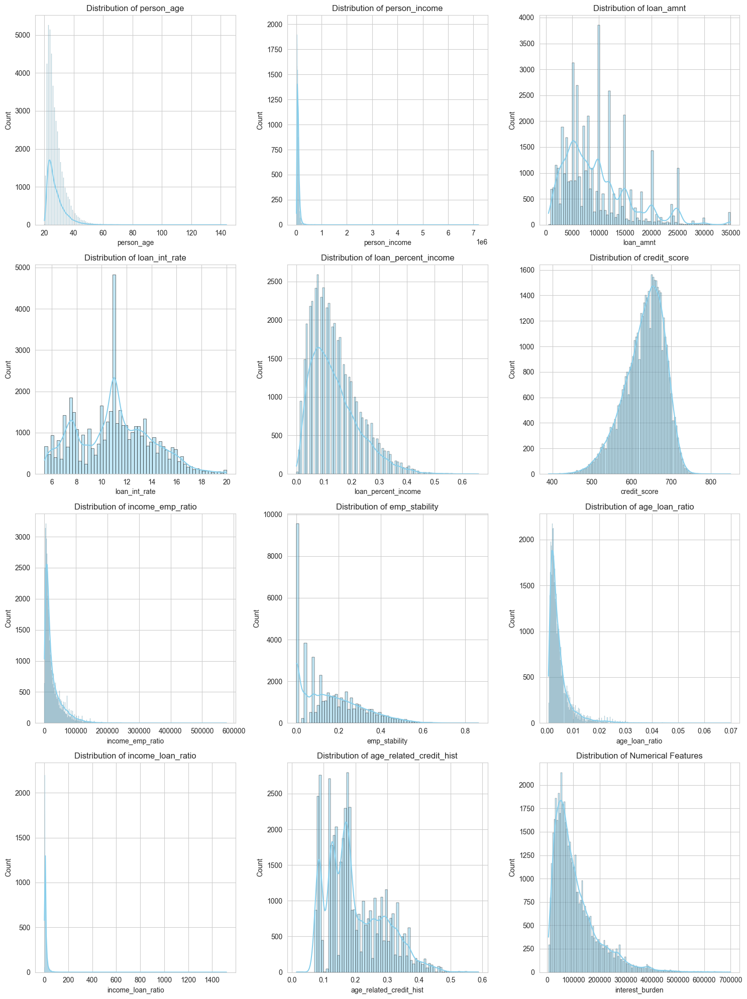

In [28]:
# Numerical features distribution
numeric_cols = df.drop('loan_status',axis=1).select_dtypes(include=np.number).columns
n_numeric = len(numeric_cols)
n_cols = 3
n_rows = (n_numeric + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='skyblue', edgecolor="black")
    axes[i].set_title(f'Distribution of {col}')

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.title("Distribution of Numerical Features")
plt.tight_layout()
plt.show()

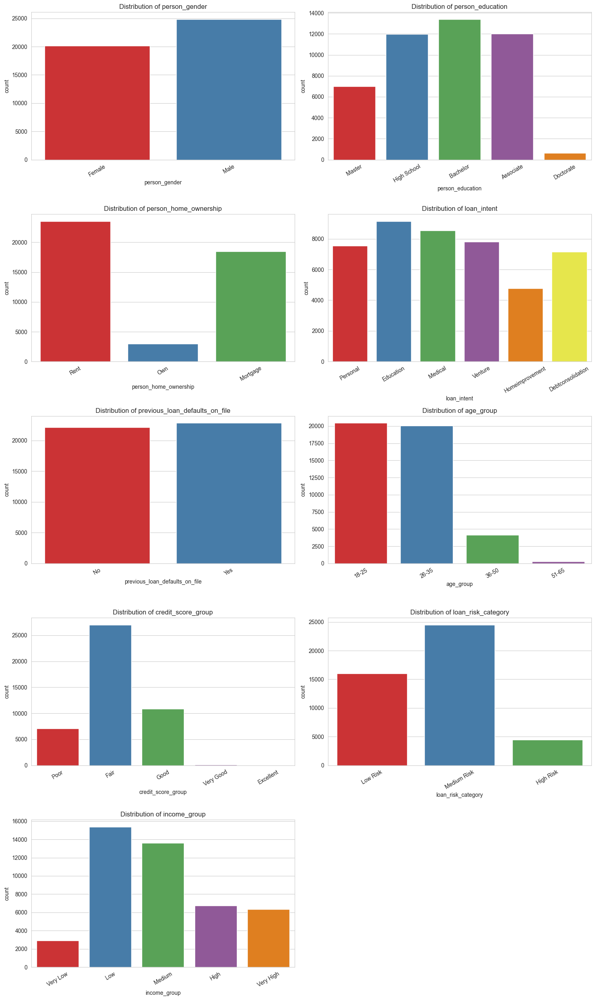

In [29]:
# Distribution for Categorical Features
cat_cols = df.select_dtypes(include=['object','category']).columns
n_cat = len(cat_cols)
n_cols = 2
n_rows = (n_cat + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.countplot(x=col, data=df, palette="Set1", ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")
    axes[i].tick_params(axis="x", rotation=30)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

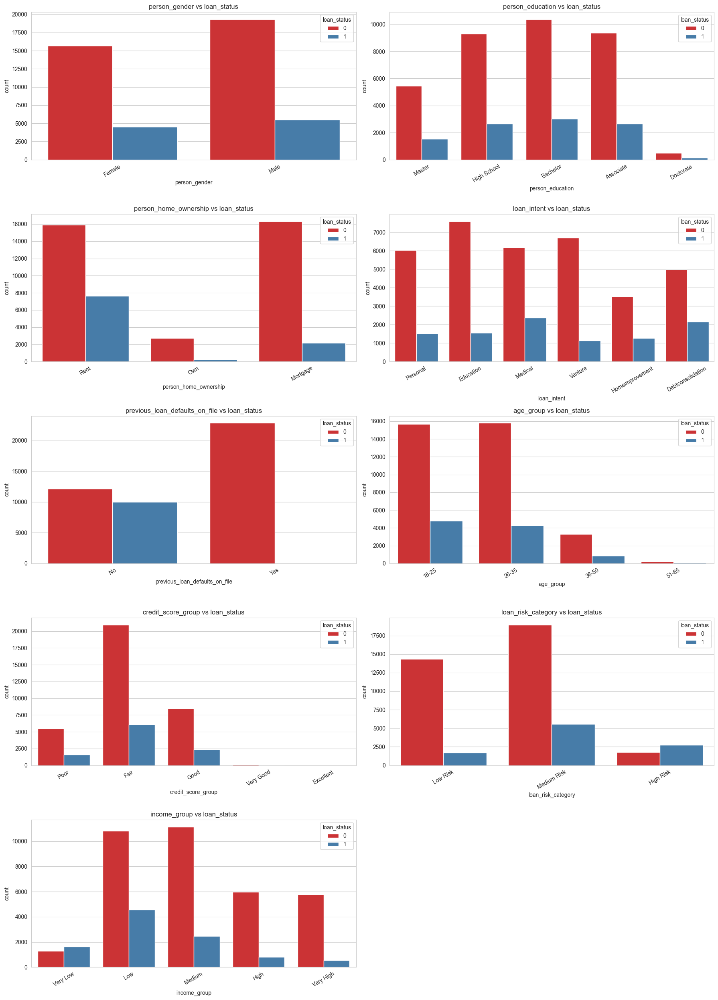

In [30]:
# Relationship between categorical features and target variable
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.countplot(x=col, hue="loan_status", data=df, palette="Set1", ax=axes[i])
    axes[i].set_title(f"{col} vs loan_status")
    axes[i].tick_params(axis="x", rotation=30)

for j in range(len(cat_cols), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

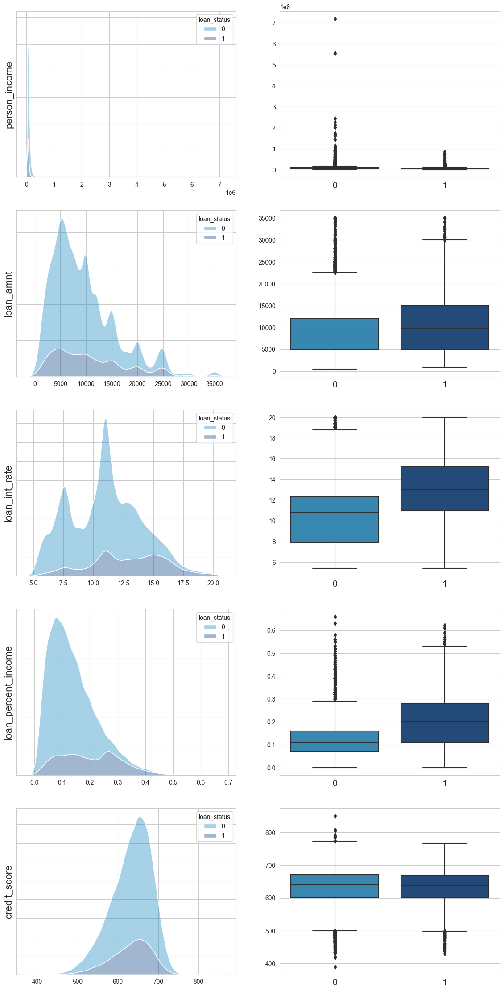

In [31]:


important_numeric = ['person_income', 'loan_amnt', 'loan_int_rate', 
                        'loan_percent_income', 'credit_score']

fig, ax = plt.subplots(ncols=2, nrows=5, figsize=(14, 28))

i=0
for cols in important_numeric:
    sns.kdeplot(x=df[cols], fill=True, alpha=0.4, hue =df.loan_status, 
                palette=('#248DC5', "#154989"), multiple='stack', ax=ax[i,0])
    
    sns.boxplot(data= df, y=cols, x='loan_status', ax=ax[i, 1],
               palette=('#248DC5', '#154989'))
    ax[i,0].set_xlabel(' ')
    ax[i,1].set_xlabel(' ')
    ax[i,1].set_ylabel(' ')
    ax[i,1].xaxis.set_tick_params(labelsize=14)
    ax[i,0].tick_params(left=False, labelleft=False)
    ax[i,0].set_ylabel(cols, fontsize=16)
    i=i+1
      
plt.show()

# Additional Analysis and Insights Generation

In [32]:
# Analysis by gender
gender_analysis = df.groupby('person_gender')['loan_status'].agg(['count', 'mean'])
gender_analysis.columns = ['Total_Loans', 'Default_Rate']
gender_analysis['Default_Rate'] = round(gender_analysis['Default_Rate'] * 100,2)
print("\n Analysis by Gender:")
gender_analysis


 Analysis by Gender:


,Total_Loans,Default_Rate
person_gender,,
Female,20159,22.25
Male,24841,22.20


In [33]:
# Analysis by education level
education_analysis = df.groupby('person_education')['loan_status'].agg(['count', 'mean']).sort_values('mean', ascending=False)
education_analysis.columns = ['Total_Loans', 'Default_Rate']
education_analysis['Default_Rate'] = round(education_analysis['Default_Rate'] * 100,2)
print("\nAnalysis by Education Level:")
education_analysis


Analysis by Education Level:


,Total_Loans,Default_Rate
person_education,,
Doctorate,621,22.87
Bachelor,13399,22.52
High School,11972,22.31
Associate,12028,22.03
Master,6980,21.76


In [34]:
# Analysis by home ownership
home_analysis = df.groupby('person_home_ownership')['loan_status'].agg(['count', 'mean']).sort_values('mean', ascending=False)
home_analysis.columns = ['Total_Loans', 'Default_Rate']
home_analysis['Default_Rate'] = round(home_analysis['Default_Rate'] * 100,2)
print("\nAnalysis by Home Ownership:")
home_analysis


Analysis by Home Ownership:


,Total_Loans,Default_Rate
person_home_ownership,,
Rent,23560,32.40
Mortgage,18489,11.60
Own,2951,7.52


In [35]:
# Analysis by loan purpose
intent_analysis = df.groupby('loan_intent')['loan_status'].agg(['count', 'mean']).sort_values('mean', ascending=False)
intent_analysis.columns = ['Total_Loans', 'Default_Rate']
intent_analysis['Default_Rate'] = round(intent_analysis['Default_Rate'] * 100,2)
print("\nAnalysis by Loan Purpose:")
intent_analysis


Analysis by Loan Purpose:


,Total_Loans,Default_Rate
loan_intent,,
Debtconsolidation,7145,30.27
Medical,8548,27.82
Homeimprovement,4783,26.30
Personal,7552,20.14
Education,9153,16.96
Venture,7819,14.43


In [36]:
# Analysis of income and default rate relationship
income_group_analysis = df.groupby('income_group')['loan_status'].agg(['count', 'mean'])
income_group_analysis.columns = ['Total_Loans', 'Default_Rate']
income_group_analysis['Default_Rate'] = round(income_group_analysis['Default_Rate'] * 100,2)
print("\nAnalysis by Income Group:")
income_group_analysis


Analysis by Income Group:


,Total_Loans,Default_Rate
income_group,,
Very Low,2903,56.22
Low,15383,29.66
Medium,13600,18.02
High,6757,11.74
Very High,6357,8.82


In [37]:
# Analysis of credit score and default rate relationship
credit_analysis = df.groupby('credit_score_group')['loan_status'].agg(['count', 'mean'])
credit_analysis.columns = ['Total_Loans', 'Default_Rate']
credit_analysis['Default_Rate'] = round(credit_analysis['Default_Rate'] * 100,2)
print("\nAnalysis by Credit Score Group:")
credit_analysis


Analysis by Credit Score Group:


,Total_Loans,Default_Rate
credit_score_group,,
Poor,7074,22.31
Fair,26992,22.45
Good,10846,21.61
Very Good,85,21.18
Excellent,3,0.00


In [38]:
# Risk analysis by loan amount and interest rate
risk_analysis = df.groupby('loan_risk_category')['loan_status'].agg(['count', 'mean'])
risk_analysis.columns = ['Total_Loans', 'Default_Rate']
risk_analysis['Default_Rate'] = round(risk_analysis['Default_Rate'] * 100,2)
print("\nRisk Analysis by Interest Rate:")
risk_analysis


Risk Analysis by Interest Rate:


,Total_Loans,Default_Rate
loan_risk_category,,
Low Risk,16043,10.78
Medium Risk,24487,22.66
High Risk,4470,60.87


In [39]:
gender_income_analysis = df.groupby('person_gender')['person_income'].agg(['mean']).reset_index()
gender_income_analysis.columns = ['person_gender','Average_income']

In [40]:
import plotly.graph_objects as go

In [41]:
fig = go.Figure(data=[
    go.Bar(name='Average Income BY Gender', 
           x=gender_income_analysis['person_gender'].astype(str), 
           y=gender_income_analysis['Average_income'],
           marker_opacity=1,
           marker={'color': gender_income_analysis['Average_income'],
                   'colorscale': 'Rainbow'})
    ])

fig.update_traces(texttemplate='%{y:.3s}', textposition='inside')

fig.update_layout(title='Average Income BY Gender',
                  title_x=0.45,
                  xaxis_title="person_gender",
                  yaxis_title="Average_income",
                  plot_bgcolor='white')
fig.show()

In [42]:
gender_loans_amount= df.groupby('person_gender',as_index=False)['loan_amnt'].agg(['mean'])

In [43]:
gender_loans_amount.columns = ['person_gender','Average_loan_amount']

In [44]:
gender_loans_amount

,person_gender,Average_loan_amount
0,Female,9508.525770
1,Male,9643.722837


In [45]:
fig = go.Figure(data=[
    go.Bar(name='Average Loans Amount BY Gender', 
           x=gender_loans_amount['person_gender'].astype(str), 
           y=gender_loans_amount['Average_loan_amount'],
           marker_opacity=1,
           marker={'color': gender_loans_amount['Average_loan_amount'],
                   'colorscale': 'Rainbow'})
    ])

fig.update_traces(texttemplate='%{y:.3s}', textposition='inside')

fig.update_layout(title='Average Loans Amount BY Gender',
                  title_x=0.45,
                  xaxis_title="person_gender",
                  yaxis_title="Average_income",
                  plot_bgcolor='white')
fig.show()

In [46]:
gender_loan_risk_category= df.groupby('person_gender',as_index=False)['loan_risk_category'].agg(['count'])

In [47]:
gender_loan_risk_category

,person_gender,count
0,Female,20159
1,Male,24841


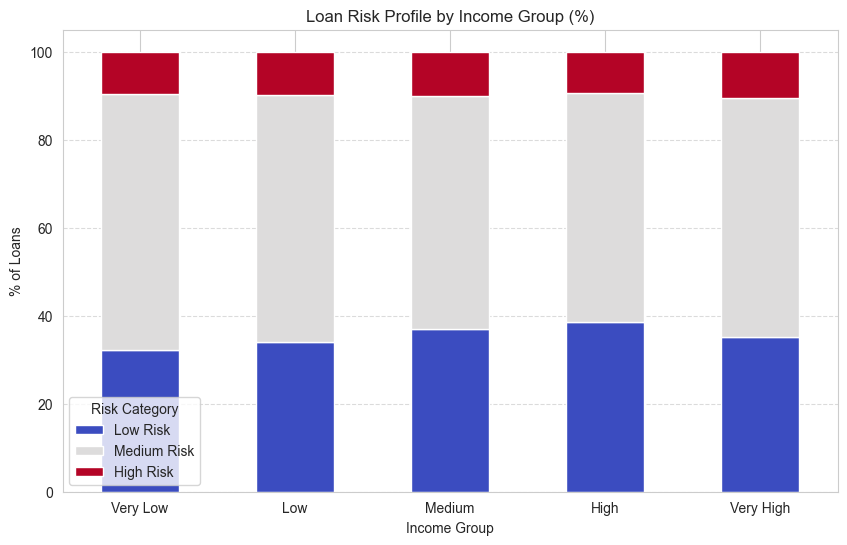

In [ ]:
risk_income_crosstab = pd.crosstab(df['income_group'], df['loan_risk_category'], normalize='index') * 100

risk_income_crosstab.plot(kind='bar', stacked=True, figsize=(10,6), colormap='coolwarm')
plt.title('Loan Risk Profile by Income Group (%)')
plt.ylabel('% of Loans')
plt.xlabel('Income Group')
plt.legend(title='Risk Category')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

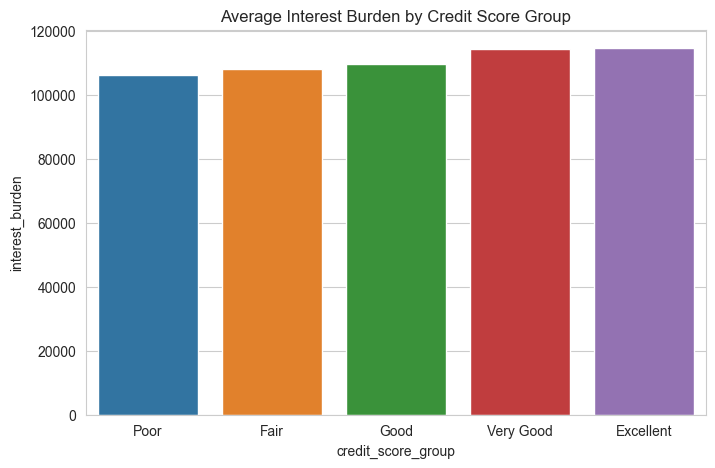

In [ ]:
plt.figure(figsize=(8,5))
sns.barplot(x='credit_score_group', y='interest_burden', data=df, ci=None)
plt.title('Average Interest Burden by Credit Score Group')
plt.show()



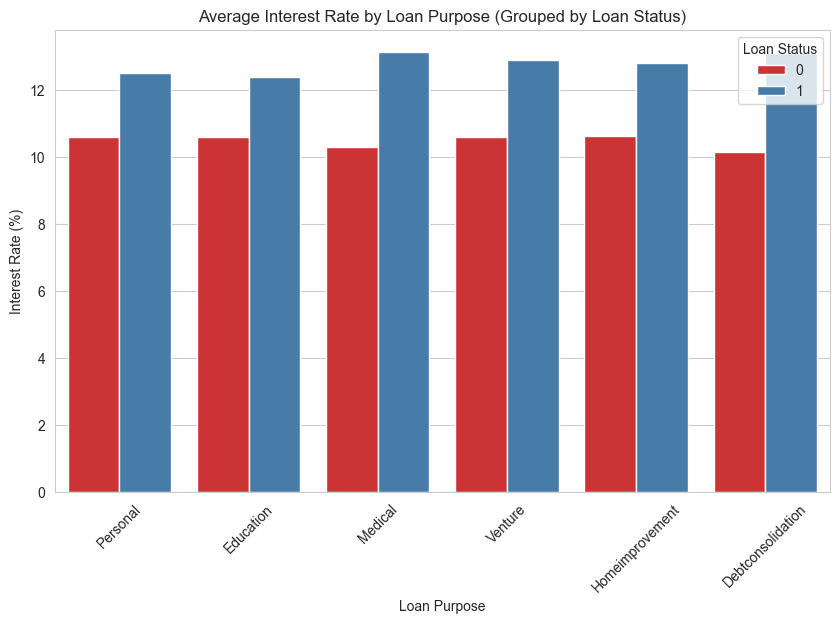

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='loan_intent', y='loan_int_rate', hue='loan_status', palette='Set1', ci=None)
plt.title('Average Interest Rate by Loan Purpose (Grouped by Loan Status)')
plt.xlabel('Loan Purpose')
plt.ylabel('Interest Rate (%)')
plt.xticks(rotation=45)
plt.legend(title='Loan Status')
plt.show()

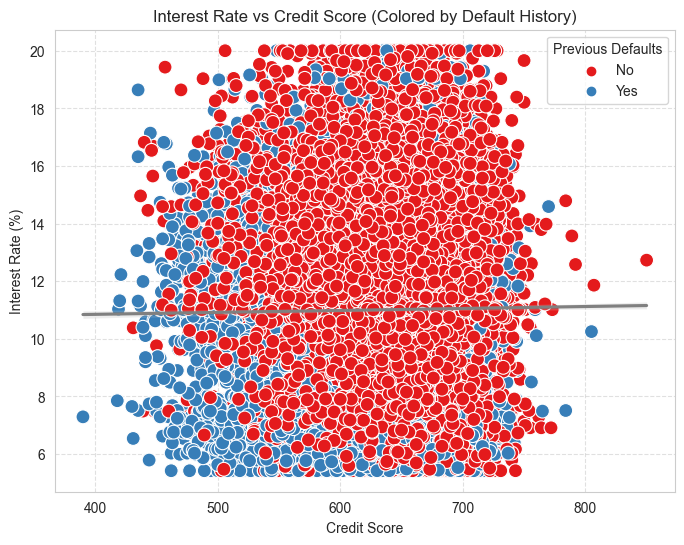

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='credit_score', y='loan_int_rate', hue='previous_loan_defaults_on_file', palette='Set1', s=100)
sns.regplot(data=df, x='credit_score', y='loan_int_rate', scatter=False, color='gray')
plt.title('Interest Rate vs Credit Score (Colored by Default History)')
plt.xlabel('Credit Score')
plt.ylabel('Interest Rate (%)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Previous Defaults')
plt.show()

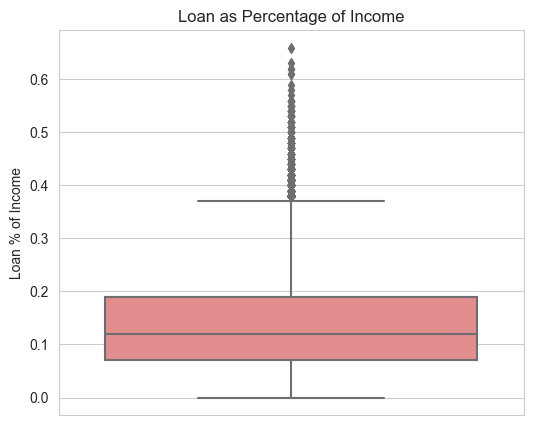

In [ ]:
plt.figure(figsize=(6, 5))
sns.boxplot(data=df, y='loan_percent_income', color='lightcoral')
plt.title('Loan as Percentage of Income')
plt.ylabel('Loan % of Income')
plt.show()

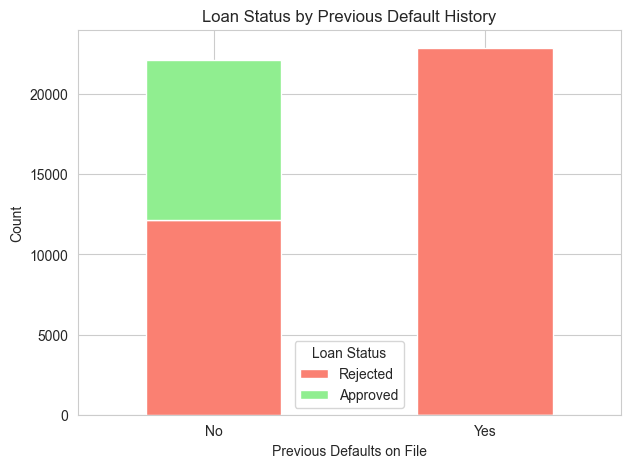

In [ ]:
pd.crosstab(df['previous_loan_defaults_on_file'], df['loan_status']).plot(kind='bar', stacked=True, figsize=(7,5), color=['salmon', 'lightgreen'])
plt.title('Loan Status by Previous Default History')
plt.xlabel('Previous Defaults on File')
plt.ylabel('Count')
plt.legend(title='Loan Status', labels=['Rejected', 'Approved'])
plt.xticks(rotation=0)
plt.show()

In [ ]:
import plotly.express as px

fig = px.scatter(df, 
                 x='person_income', 
                 y='loan_amnt', 
                 color='loan_status',
                 size='credit_score',
                 hover_data=['person_age', 'person_education', 'loan_intent'],
                 title='Interactive: Loan Amount vs Income (Hover for Details)')
fig.update_layout(xaxis_title='Income', yaxis_title='Loan Amount')
fig.show()

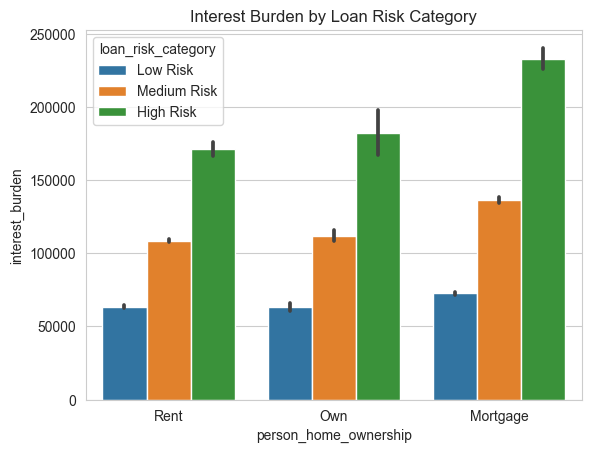

In [ ]:
sns.barplot(x='person_home_ownership', y='interest_burden', data=df,hue='loan_risk_category')
plt.title('Interest Burden by Loan Risk Category')
plt.show()

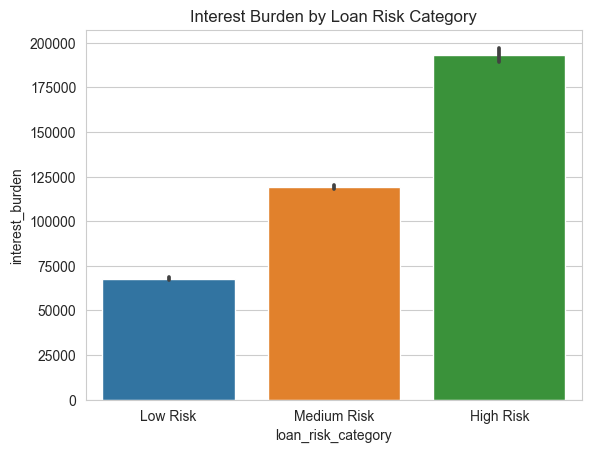

In [ ]:
sns.barplot(x='loan_risk_category', y='interest_burden', data=df)
plt.title('Interest Burden by Loan Risk Category')
plt.show()


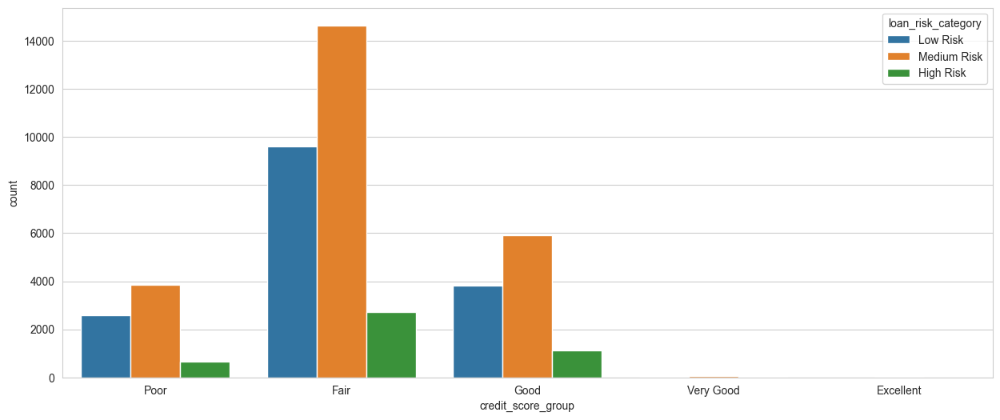

In [ ]:
plt.figure(figsize=(15,6))
sns.countplot(x='credit_score_group', hue='loan_risk_category', data=df)
plt.show()

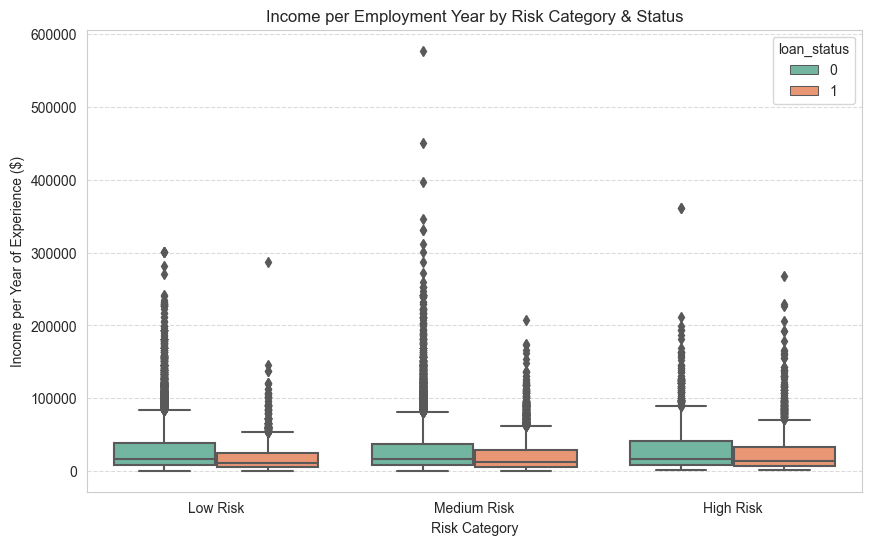

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='loan_risk_category', y='income_emp_ratio', hue='loan_status', palette='Set2')
plt.title('Income per Employment Year by Risk Category & Status')
plt.ylabel('Income per Year of Experience ($)')
plt.xlabel('Risk Category')
# plt.yscale('log')  # Often skewed — log scale helps
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Stable income (high ratio) → lower risk? Higher approval? 

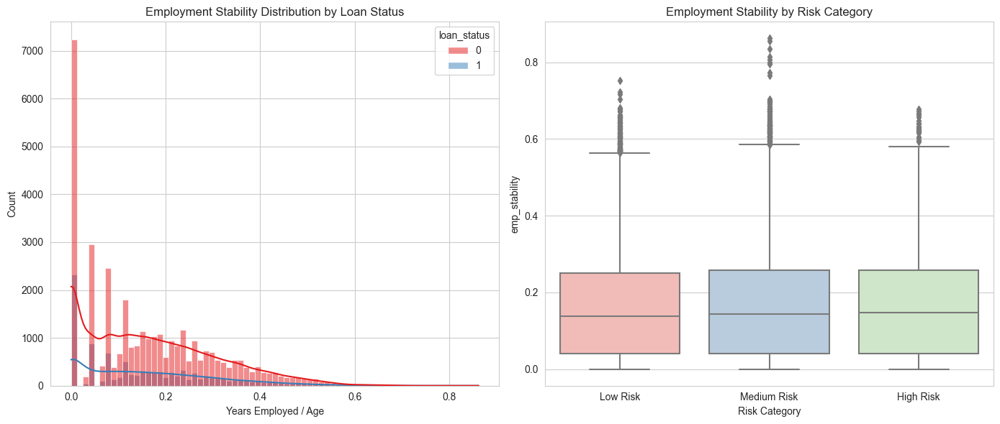

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(data=df, x='emp_stability', hue='loan_status', kde=True, ax=axes[0], palette='Set1')
axes[0].set_title('Employment Stability Distribution by Loan Status')
axes[0].set_xlabel('Years Employed / Age')

sns.boxplot(data=df, x='loan_risk_category', y='emp_stability', ax=axes[1], palette='Pastel1')
axes[1].set_title('Employment Stability by Risk Category')
axes[1].set_xlabel('Risk Category')

plt.tight_layout()
plt.show()

More stable employment → lower risk? Validate with stats later.

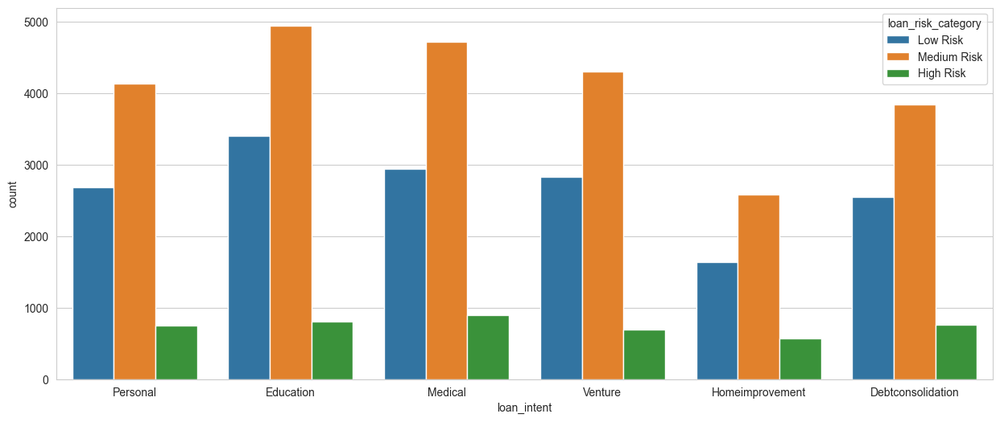

In [ ]:
plt.figure(figsize=(15,6))
sns.countplot(x='loan_intent', hue='loan_risk_category', data=df)
plt.show()


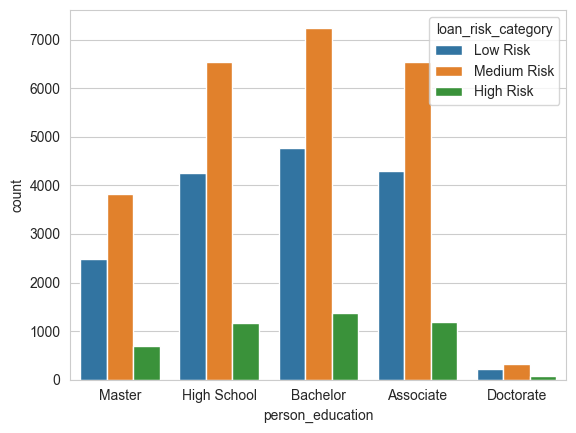

In [ ]:
sns.countplot(x='person_education', hue='loan_risk_category', data=df)
plt.show()


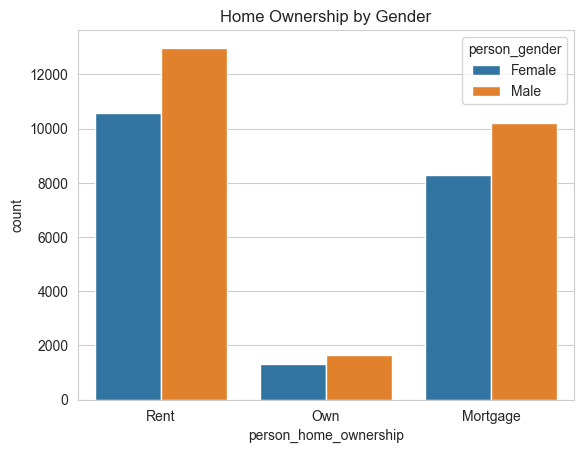

In [ ]:
sns.countplot(x='person_home_ownership', hue='person_gender', data=df)
plt.title('Home Ownership by Gender')
plt.show()


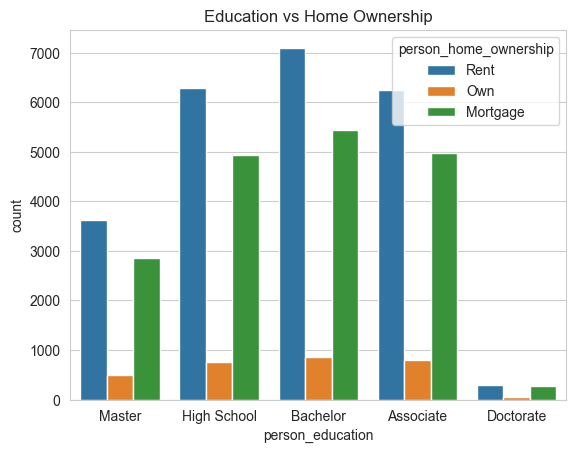

In [ ]:
sns.countplot(x='person_education', hue='person_home_ownership', data=df)
plt.title('Education vs Home Ownership')
plt.show()


In [ ]:
import plotly.graph_objects as go
from plotly.offline import iplot

# Group mapping
edu_credit = df.groupby(['person_education', 'credit_score_group']).size().reset_index(name='count')

labels = list(set(edu_credit['person_education'])) + list(set(edu_credit['credit_score_group']))
label_dict = {label: idx for idx, label in enumerate(labels)}

source = [label_dict[row['person_education']] for _, row in edu_credit.iterrows()]
target = [label_dict[row['credit_score_group']] for _, row in edu_credit.iterrows()]
value = edu_credit['count'].tolist()

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
        color="lightblue"
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color='rgba(100, 150, 250, 0.4)'
    )
)])

fig.update_layout(title_text="Education → Credit Score Group Flow", font_size=12)
fig.show()

Shows which education levels lead to which credit tiers — useful for underwriting policy

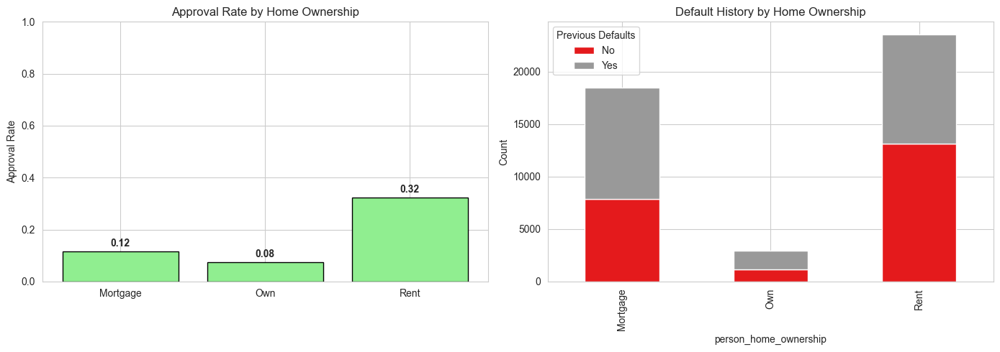

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Approval Rate
home_approval = df.groupby('person_home_ownership')['loan_status'].mean().reset_index()
bars1 = axes[0].bar(home_approval['person_home_ownership'], home_approval['loan_status'], color='lightgreen', edgecolor='black')
axes[0].set_title('Approval Rate by Home Ownership')
axes[0].set_ylabel('Approval Rate')
axes[0].set_ylim(0,1)
for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01, f'{height:.2f}', 
                 ha='center', va='bottom', fontweight='bold')

# Default History Crosstab
pd.crosstab(df['person_home_ownership'], df['previous_loan_defaults_on_file']).plot(kind='bar', stacked=True, ax=axes[1], colormap='Set1')
axes[1].set_title('Default History by Home Ownership')
axes[1].set_ylabel('Count')
axes[1].legend(title='Previous Defaults')

plt.tight_layout()
plt.show()

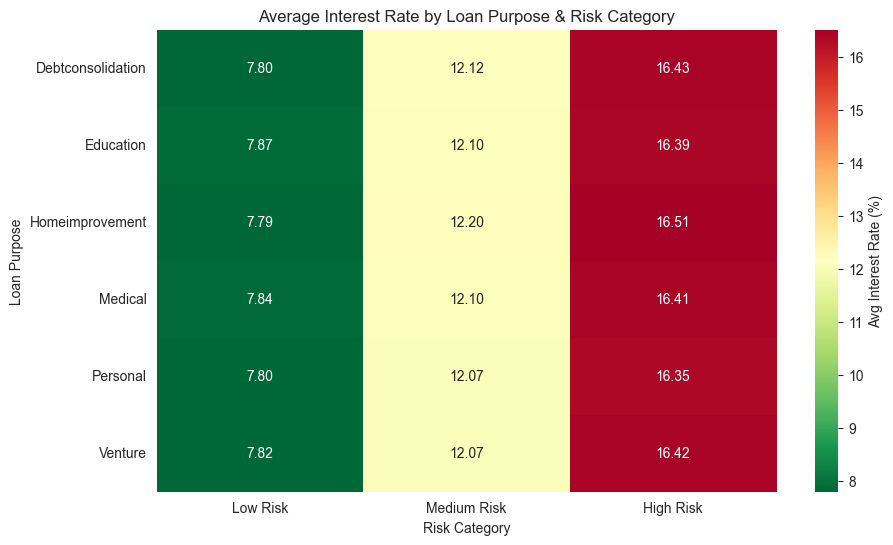

In [ ]:
intent_risk = df.groupby(['loan_intent', 'loan_risk_category'])['loan_int_rate'].mean().unstack()

plt.figure(figsize=(10,6))
sns.heatmap(intent_risk, annot=True, fmt='.2f', cmap='RdYlGn_r', cbar_kws={'label': 'Avg Interest Rate (%)'})
plt.title('Average Interest Rate by Loan Purpose & Risk Category')
plt.xlabel('Risk Category')
plt.ylabel('Loan Purpose')
plt.show()

Debtconsolidation  carry higher rates if labeled high risk. when label is hight the Loan interest rate  increase 

In [ ]:
fig = px.treemap(df, 
                 path=[px.Constant("All Loans"), 'loan_intent', 'loan_risk_category'], 
                 values='loan_amnt',
                 color='loan_int_rate',
                 hover_data=['credit_score', 'person_income'],
                 color_continuous_scale='RdBu',
                 title='Loan Portfolio Breakdown by Purpose & Risk (Color = Avg Interest Rate)')
fig.update_traces(textinfo="label+value")
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
fig.show()

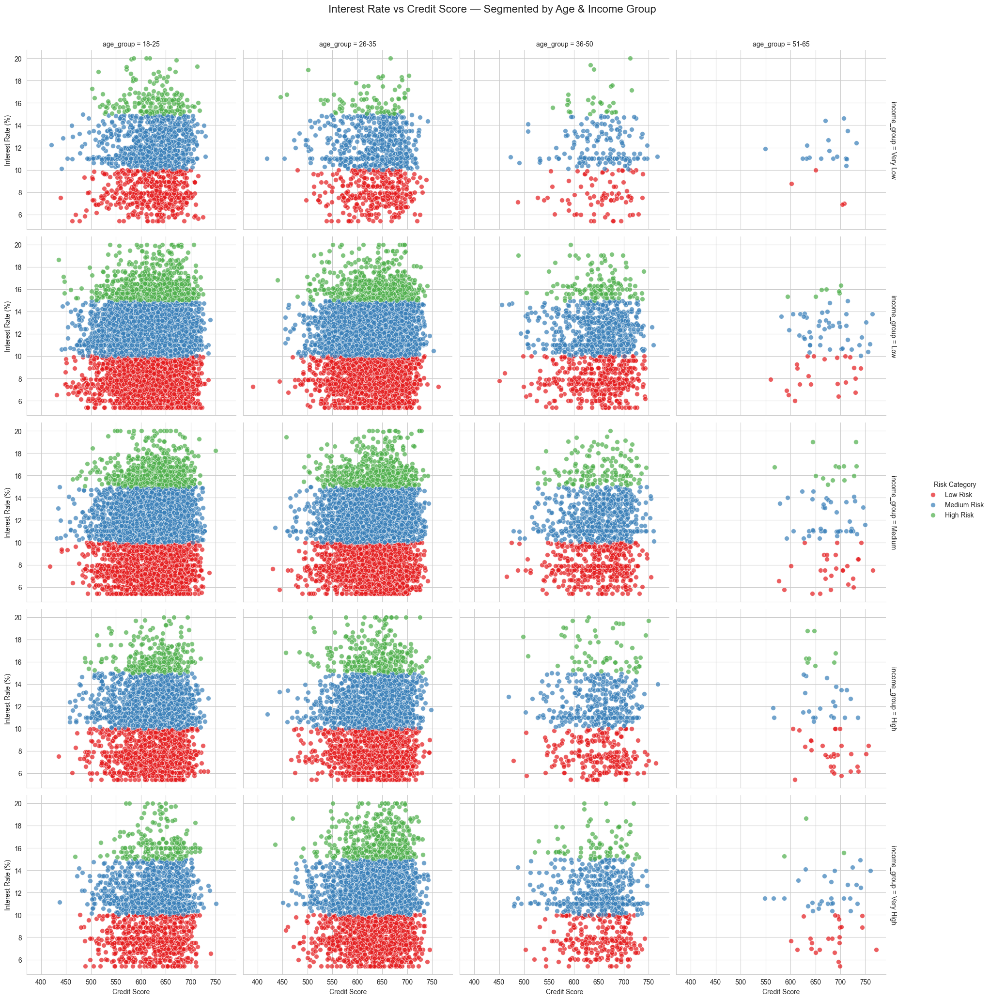

In [ ]:
g = sns.FacetGrid(df, col='age_group', row='income_group', hue='loan_risk_category', 
                  height=4, aspect=1.2, palette='Set1', margin_titles=True)
g.map(sns.scatterplot, 'credit_score', 'loan_int_rate', alpha=0.7, s=50)
g.add_legend(title='Risk Category')
g.set_axis_labels('Credit Score', 'Interest Rate (%)')
g.fig.suptitle('Interest Rate vs Credit Score — Segmented by Age & Income Group', y=1.03, fontsize=16)
plt.show()

In [56]:
print(df)

       person_age person_gender person_education  person_income  \
0            22.0        Female           Master        71948.0   
1            21.0        Female      High School        12282.0   
2            25.0        Female      High School        12438.0   
3            23.0        Female         Bachelor        79753.0   
4            24.0          Male           Master        66135.0   
...           ...           ...              ...            ...   
44995        27.0          Male        Associate        47971.0   
44996        37.0        Female        Associate        65800.0   
44997        33.0          Male        Associate        56942.0   
44998        29.0          Male         Bachelor        33164.0   
44999        24.0          Male      High School        51609.0   

      person_home_ownership  loan_amnt        loan_intent  loan_int_rate  \
0                      Rent    35000.0           Personal          16.02   
1                       Own     1000.0     

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   person_age                      45000 non-null  float64 
 1   person_gender                   45000 non-null  object  
 2   person_education                45000 non-null  object  
 3   person_income                   45000 non-null  float64 
 4   person_home_ownership           45000 non-null  object  
 5   loan_amnt                       45000 non-null  float64 
 6   loan_intent                     45000 non-null  object  
 7   loan_int_rate                   45000 non-null  float64 
 8   loan_percent_income             45000 non-null  float64 
 9   credit_score                    45000 non-null  int64   
 10  previous_loan_defaults_on_file  45000 non-null  object  
 11  loan_status                     45000 non-null  int64   
 12  income_emp_ratio  

#### Handle object data

In [58]:
df.select_dtypes(include='object').columns

Index(['person_gender', 'person_education', 'person_home_ownership',
       'loan_intent', 'previous_loan_defaults_on_file'],
      dtype='object')

In [59]:
df['person_home_ownership'].value_counts()

person_home_ownership
Rent        23560
Mortgage    18489
Own          2951
Name: count, dtype: int64

In [60]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['person_home_ownership'] = le.fit_transform(df['person_home_ownership'])

In [61]:
df['loan_intent'].value_counts()

loan_intent
Education            9153
Medical              8548
Venture              7819
Personal             7552
Debtconsolidation    7145
Homeimprovement      4783
Name: count, dtype: int64

In [62]:
df['loan_intent'] = le.fit_transform(df['loan_intent'])

In [63]:
df=pd.get_dummies(df,columns=['person_gender','person_education','previous_loan_defaults_on_file'],drop_first=True)

In [64]:
df = df.replace({True: 1, False: 0})



In [69]:
df

,person_age,person_income,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,credit_score,loan_status,income_emp_ratio,...,age_related_credit_hist,interest_burden,loan_risk_category,income_group,person_gender_Male,person_education_Bachelor,person_education_Doctorate,person_education_High School,person_education_Master,previous_loan_defaults_on_file_Yes
0,22.0,71948.0,2,35000.0,4,16.02,0.49,561,1,71948.000000,...,0.136364,560700.00,High Risk,Medium,0,0,0,0,1,0
1,21.0,12282.0,1,1000.0,1,11.14,0.08,504,0,12282.000000,...,0.095238,11140.00,Medium Risk,Very Low,0,0,0,1,0,1
2,25.0,12438.0,0,5500.0,3,12.87,0.44,635,1,3109.500000,...,0.120000,70785.00,Medium Risk,Very Low,0,0,0,1,0,0
3,23.0,79753.0,2,35000.0,3,15.23,0.44,675,1,79753.000000,...,0.086957,533050.00,High Risk,Medium,0,1,0,0,0,0
4,24.0,66135.0,2,35000.0,3,14.27,0.53,586,1,33067.500000,...,0.166667,499450.00,Medium Risk,Medium,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,27.0,47971.0,2,15000.0,3,15.66,0.31,645,1,6853.000000,...,0.111111,234900.00,High Risk,Low,1,0,0,0,0,0
44996,37.0,65800.0,2,9000.0,2,14.07,0.14,621,1,3655.555556,...,0.297297,126630.00,Medium Risk,Medium,0,0,0,0,0,0
44997,33.0,56942.0,2,2771.0,0,10.02,0.05,668,1,7117.750000,...,0.303030,27765.42,Medium Risk,Low,1,0,0,0,0,0
44998,29.0,33164.0,2,12000.0,1,13.23,0.36,604,1,6632.800000,...,0.206897,158760.00,Medium Risk,Low,1,1,0,0,0,0


In [66]:
df=df.drop(columns=['age_group','credit_score_group'],axis=1)

In [67]:
df['loan_intent'] = le.fit_transform(df['loan_intent'])

In [70]:
df['loan_risk_category'] = le.fit_transform(df['loan_risk_category'])
df['income_group'] = le.fit_transform(df['income_group'])

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 23 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   person_age                          45000 non-null  float64
 1   person_income                       45000 non-null  float64
 2   person_home_ownership               45000 non-null  int32  
 3   loan_amnt                           45000 non-null  float64
 4   loan_intent                         45000 non-null  int64  
 5   loan_int_rate                       45000 non-null  float64
 6   loan_percent_income                 45000 non-null  float64
 7   credit_score                        45000 non-null  int64  
 8   loan_status                         45000 non-null  int64  
 9   income_emp_ratio                    45000 non-null  float64
 10  emp_stability                       45000 non-null  float64
 11  age_loan_ratio                      45000

# =============================================================================
# split & Standardizing The Data
# =============================================================================


In [76]:
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression


In [72]:
x=df.drop('loan_status',axis=1)
y=df['loan_status']

In [ ]:

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)
scaler = StandardScaler()
scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)


In [74]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((36000, 22), (9000, 22), (36000,), (9000,))

# =============================================================================
# Modelling
# =============================================================================


In [79]:
###first model Logistic Regression
model = LogisticRegression()
model.fit(x_train,y_train)
y_pred=model.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print(f"acuuuracy for train model is {model.score(x_train,y_train)}")
print(f"acuuuracy for test model is {model.score(x_test,y_test)}")


Accuracy: 0.9035555555555556
F1 Score: 0.7768637532133676
acuuuracy for train model is 0.8981944444444444
acuuuracy for test model is 0.9035555555555556


In [80]:
model.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

classification report:              precision    recall  f1-score   support

           0       0.93      0.95      0.94      7000
           1       0.80      0.74      0.77      2000

    accuracy                           0.90      9000
   macro avg       0.87      0.85      0.86      9000
weighted avg       0.90      0.90      0.90      9000
 
[[6636  364]
 [ 511 1489]]


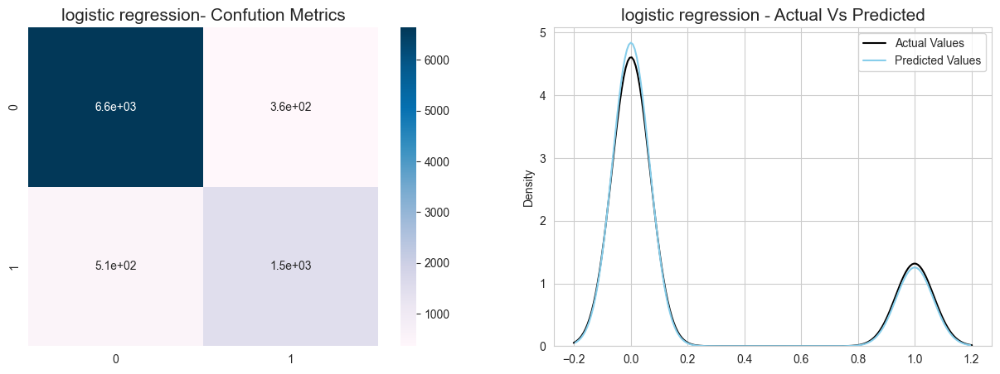

In [86]:
cals_report=classification_report(y_test,y_pred)

print(f'classification report:{cals_report} ')

cm = confusion_matrix(y_test, y_pred)
print(cm)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'logistic regression- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred, color='skyblue',label='Predicted Values')
plt.title(f'logistic regression - Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

# =============================================================================
# Handel imbalance 
# =============================================================================


with class weight

In [127]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
model5=LogisticRegression(class_weight='balanced')
model5.fit(x_train,y_train)
y_pred1=model5.predict(x_test)
accuracyModel1=accuracy_score(y_test,y_pred1)
print(f"accuracy of the model is {accuracyModel1}")

accuracy of the model is 0.8563333333333333


In [128]:
print(f"acuuuracy for train model is {model5.score(x_train,y_train)}")
print(f"acuuuracy for test model is {model5.score(x_test,y_test)}")

acuuuracy for train model is 0.8580277777777777
acuuuracy for test model is 0.8563333333333333


# =============================================================================
# Oversampling 
# =============================================================================


In [129]:
from imblearn.over_sampling import SMOTE
# Oversample Minority Class
ros = SMOTE()
X_resampled, y_resampled = ros.fit_resample(x_train, y_train)

In [130]:
X_resampled.shape

(56000, 22)

In [132]:
x_test.shape

(9000, 22)

In [202]:
model1 = LogisticRegression(C=0.001,solver='newton-cg')
model1.fit(X_resampled,y_resampled)
y_pred=model1.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print(f"acuuuracy for train model is {model1.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model1.score(x_test,y_test)}")

Accuracy: 0.852
F1 Score: 0.7315598548972189
acuuuracy for train model is 0.8784285714285714
acuuuracy for test model is 0.852


classification report:              precision    recall  f1-score   support

           0       0.97      0.84      0.90      7000
           1       0.61      0.91      0.73      2000

    accuracy                           0.85      9000
   macro avg       0.79      0.87      0.81      9000
weighted avg       0.89      0.85      0.86      9000
 
__________________________________________________

[[5853 1147]
 [ 185 1815]]


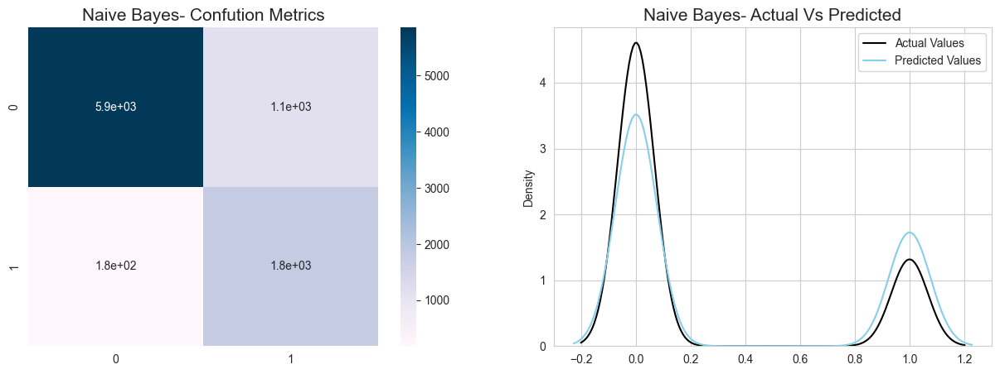

In [145]:
cals_report=classification_report(y_test,y_pred)

print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred)
print(cm)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Naive Bayes- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred, color='skyblue',label='Predicted Values')
plt.title(f'Naive Bayes- Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [ ]:
#### naive bayes
from sklearn.naive_bayes import GaussianNB
model2 = GaussianNB()
model2.fit(X_resampled,y_resampled)
y_pred2=model2.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred2))
print(f"acuuuracy for train model2 is {model2.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model2 is {model2.score(x_test,y_test)}")



Accuracy: 0.7461111111111111
acuuuracy for train model2 is 0.7408888888888889
acuuuracy for test model2 is 0.7461111111111111


classification report:              precision    recall  f1-score   support

           0       1.00      0.68      0.81      7000
           1       0.47      0.99      0.63      2000

    accuracy                           0.75      9000
   macro avg       0.73      0.83      0.72      9000
weighted avg       0.88      0.75      0.77      9000
 
__________________________________________________



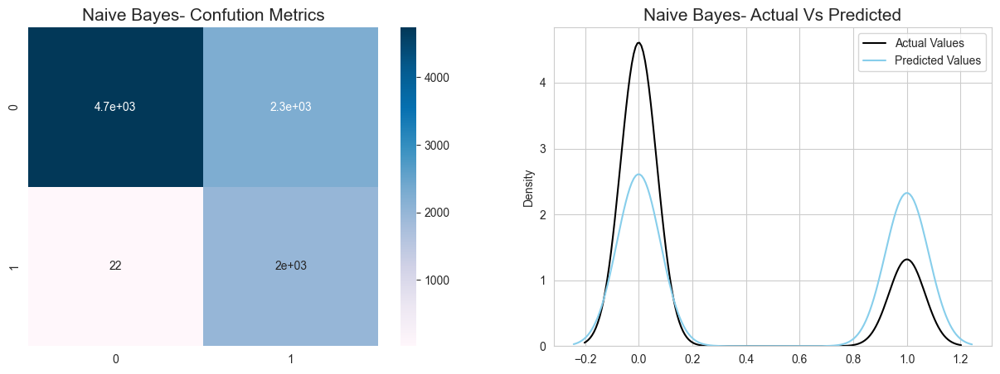

In [147]:
cals_report=classification_report(y_test,y_pred2)

print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred2)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Naive Bayes- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred2, color='skyblue',label='Predicted Values')
plt.title(f'Naive Bayes- Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [ ]:
from sklearn.naive_bayes import BernoulliNB
model3 = BernoulliNB()
model3.fit(X_resampled,y_resampled)
y_pred3=model3.predict(x_test)
### Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred3))
print(f"acuuuracy for train model3 is {model3.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model3 is {model3.score(x_test,y_test)}")


Accuracy: 0.8317777777777777
acuuuracy for train model3 is 0.8283888888888888
acuuuracy for test model3 is 0.8317777777777777


classification report:              precision    recall  f1-score   support

           0       0.95      0.82      0.88      7000
           1       0.58      0.86      0.69      2000

    accuracy                           0.83      9000
   macro avg       0.77      0.84      0.79      9000
weighted avg       0.87      0.83      0.84      9000
 
__________________________________________________

[[5767 1233]
 [ 281 1719]]


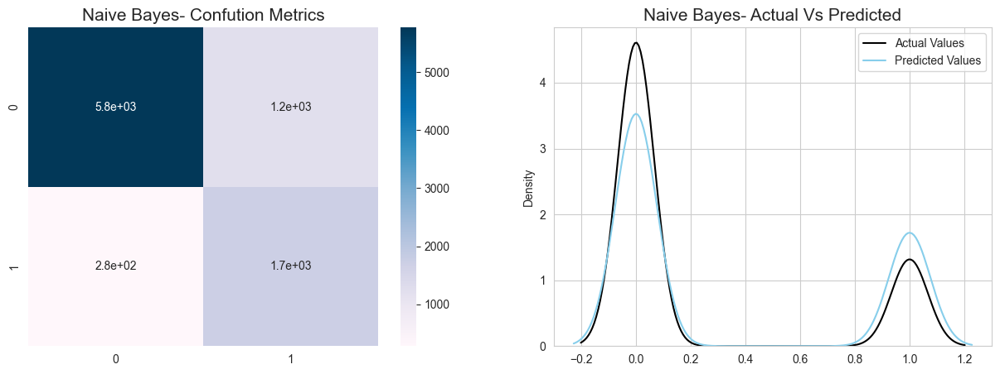

In [150]:
cals_report=classification_report(y_test,y_pred3)

print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred3)
print(cm)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Naive Bayes- Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred3, color='skyblue',label='Predicted Values')
plt.title(f'Naive Bayes- Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [ ]:
from sklearn.svm import SVC
model4=SVC(kernel='rbf',C=0.01,max_iter=5000)
model4.fit(X_resampled,y_resampled)
y_pred4=model4.predict(x_test)
acc=accuracy_score(y_test,y_pred4)
print(acc)
print(f"acuuuracy for train model is {model4.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model4.score(x_test,y_test)}")

0.8806666666666667
acuuuracy for train model is 0.8815555555555555
acuuuracy for test model is 0.8806666666666667


In [169]:
from sklearn.neighbors import KNeighborsClassifier
KNN=KNeighborsClassifier(n_neighbors=3)
KNN.fit(X_resampled,y_resampled)
y_pred=KNN.predict(x_test)
print("Accurancy:",accuracy_score(y_test,y_pred))
print(f"acuuuracy for train model is {KNN.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {KNN.score(x_test,y_test)}")

Accurancy: 0.8517777777777777
acuuuracy for train model is 0.9541428571428572
acuuuracy for test model is 0.8517777777777777


#### ensamble methods 

In [ ]:
###
from sklearn.tree import DecisionTreeClassifier
model7=DecisionTreeClassifier(max_depth=5,max_features=15,criterion='entropy',min_samples_split=10)
model7.fit(X_resampled,y_resampled)
y_pred7=model7.predict(x_test)
acc=accuracy_score(y_test,y_pred7)
print(f'Accuracy Score: {acc:.2f}')
print(f"acuuuracy for train model is {model7.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model7.score(x_test,y_test)}")


Accuracy Score: 0.87
acuuuracy for train model is 0.8672857142857143
acuuuracy for test model is 0.8665555555555555


In [157]:
model7.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 4,
 'max_features': 20,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': None,
 'splitter': 'best'}

In [170]:
##random forest
from sklearn.ensemble import RandomForestClassifier
model8=RandomForestClassifier(n_estimators=100,max_depth=4,max_features=15,criterion='entropy',min_samples_split=10)
model8.fit(X_resampled,y_resampled)
y_pred8=model8.predict(x_test)
acc=accuracy_score(y_test,y_pred8)
print(f'Accuracy Score: {acc:.2f}')
print(f"acuuuracy for train model is {model8.score(X_resampled,y_resampled)}")
print(f"acuuuracy for test model is {model8.score(x_test,y_test)}")

Accuracy Score: 0.87
acuuuracy for train model is 0.8812678571428572
acuuuracy for test model is 0.8746666666666667


Accuracy Score: 0.87
confusion matrix:
 [[6146  854]
 [ 274 1726]]
classification report:              precision    recall  f1-score   support

           0       0.96      0.88      0.92      7000
           1       0.67      0.86      0.75      2000

    accuracy                           0.87      9000
   macro avg       0.81      0.87      0.83      9000
weighted avg       0.89      0.87      0.88      9000
 
__________________________________________________



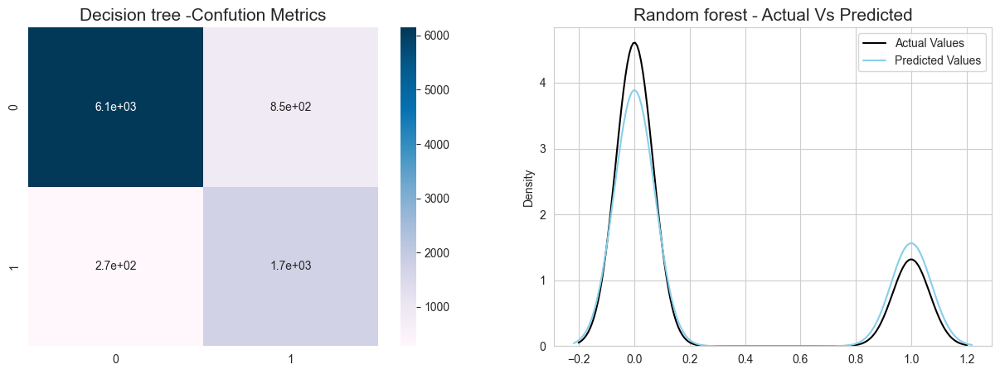

In [ ]:
cals_report=classification_report(y_test,y_pred8)
acc=accuracy_score(y_test,y_pred8)
print(f'Accuracy Score: {acc:.2f}')
print(f'confusion matrix:\n {confusion_matrix(y_test,y_pred8)}')
print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred8)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'Random forest-Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred8, color='skyblue',label='Predicted Values')
plt.title(f'Random forest - Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [174]:
from xgboost import XGBClassifier
XG=XGBClassifier()
XG.fit(X_resampled,y_resampled)
y_pred9=XG.predict(x_test)
acc=accuracy_score(y_test,y_pred9)
print(f'Accuracy Score: {acc:.2f}')

Accuracy Score: 0.93


Accuracy Score: 0.93
confusion matrix:
 [[6721  279]
 [ 334 1666]]
classification report:              precision    recall  f1-score   support

           0       0.95      0.96      0.96      7000
           1       0.86      0.83      0.84      2000

    accuracy                           0.93      9000
   macro avg       0.90      0.90      0.90      9000
weighted avg       0.93      0.93      0.93      9000
 
__________________________________________________



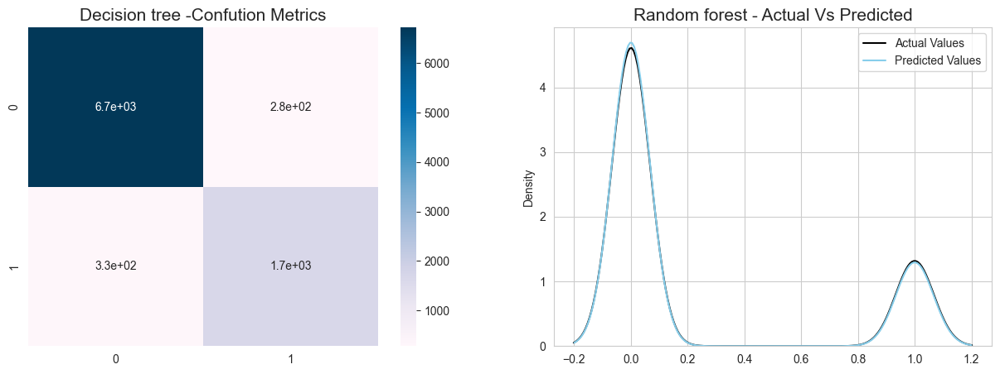

In [ ]:
cals_report=classification_report(y_test,y_pred9)
acc=accuracy_score(y_test,y_pred9)
print(f'Accuracy Score: {acc:.2f}')
print(f'confusion matrix:\n {confusion_matrix(y_test,y_pred9)}')
print(f'classification report:{cals_report} ')
print('_' * 50)
print()

cm = confusion_matrix(y_test, y_pred9)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, cmap='PuBu')
plt.title(f'XGBoosting -Confution Metrics', fontsize=15)

plt.subplot(1, 2, 2)
sns.kdeplot(y_test.values, color='black', label='Actual Values')
sns.kdeplot(y_pred9, color='skyblue',label='Predicted Values')
plt.title(f'XGBoosting - Actual Vs Predicted', fontsize=15)
plt.legend()
plt.show()

In [180]:
X_resampled=pd.DataFrame(X_resampled,columns=x.columns)
X_resampled

x_test=pd.DataFrame(x_test,columns=x.columns)


In [181]:
from xgboost import XGBClassifier
XG=XGBClassifier()
XG.fit(X_resampled,y_resampled)
y_pred9=XG.predict(x_test)
acc=accuracy_score(y_test,y_pred9)
print(f'Accuracy Score: {acc:.2f}')

Accuracy Score: 0.93


In [188]:
importance_dict = XG.get_booster().get_score(importance_type='gain')

# Create DataFrame and sort
importance_df = pd.DataFrame({
    'Feature': list(importance_dict.keys()),
    'Importance (Gain)': list(importance_dict.values())
}).sort_values('Importance (Gain)', ascending=False)  # Sort DESC

# Show top 20
importance_df = importance_df.head(20)

In [189]:
import plotly.express as px
import plotly.graph_objects as go

# Create horizontal bar chart (best for feature names)
fig = px.bar(
    importance_df,
    x='Importance (Gain)',
    y='Feature',
    orientation='h',
    color='Importance (Gain)',
    color_continuous_scale='Blues',  # Professional blue gradient
    title='🔝 Top 20 Features Driving Loan Approval — XGBoost Model',
    height=800,
    text='Importance (Gain)'  # Show values on bars
)

# Flip y-axis so most important is on top
fig.update_layout(
    yaxis={'categoryorder':'total ascending'},  # Most important at top
    title_font_size=22,
    title_font_color='#2E86AB',
    xaxis_title="Feature Importance (Total Gain)",
    yaxis_title="Feature Name",
    template="plotly_white",
    font=dict(size=14),
    hoverlabel=dict(bgcolor="white", font_size=14, font_family="Arial")
)

# Format text on bars
fig.update_traces(
    texttemplate='%{text:.3f}',
    textposition='outside',
    marker_line_color='rgb(8,48,107)',
    marker_line_width=1.5
)

# Add grid
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGray')

# Show plot
fig.show()

In [190]:
from yellowbrick.classifier import ROCAUC
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier,RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
mod = []
cv_score=[]
model =[AdaBoostClassifier(), BaggingClassifier(), GradientBoostingClassifier(), ExtraTreeClassifier(), RandomForestClassifier()]
for m in model:
    cv_score.append(cross_val_score(m, X_resampled, y_resampled, scoring='accuracy', cv=5).mean())
    mod.append(m)
model_df=pd.DataFrame(columns=['model','cv_score'])
model_df['model']=mod
model_df['cv_score']=cv_score
model_df.sort_values(by=['cv_score'], ascending=True).style.background_gradient(subset=['cv_score'])


,model,cv_score
3,ExtraTreeClassifier(),0.901125
0,AdaBoostClassifier(),0.909125
2,GradientBoostingClassifier(),0.920250
1,BaggingClassifier(),0.938196
4,RandomForestClassifier(),0.948821


In [191]:
from catboost import CatBoostClassifier
model_cat=CatBoostClassifier(iterations=300,learning_rate=0.03,depth=8,eval_metric="Accuracy",verbose=50,random_state=0)
model_cat.fit(X_resampled,y_resampled)
y_pred10=model_cat.predict(x_test)
acc=accuracy_score(y_test,y_pred10)
print(f'Accuracy Score: {acc:.2f}')
# Import necessary libraries
cals_report=classification_report(y_test,y_pred10)
acc=accuracy_score(y_test,y_pred10)
print(f'Accuracy Score: {acc:.2f}')
print(f'confusion matrix:\n {confusion_matrix(y_test,y_pred10)}')

0:	learn: 0.8838571	total: 186ms	remaining: 55.5s
50:	learn: 0.9180714	total: 2.59s	remaining: 12.7s
100:	learn: 0.9301786	total: 4.6s	remaining: 9.07s
150:	learn: 0.9364464	total: 6.97s	remaining: 6.87s
200:	learn: 0.9405357	total: 9.76s	remaining: 4.81s
250:	learn: 0.9452500	total: 11.7s	remaining: 2.29s
299:	learn: 0.9484821	total: 13.8s	remaining: 0us
Accuracy Score: 0.92
Accuracy Score: 0.92
confusion matrix:
 [[6613  387]
 [ 328 1672]]


In [ ]:
from sklearn.linear_model import LogisticRegression,RidgeClassifier,SGDClassifier,PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.svm import SVC,LinearSVC,NuSVC
from sklearn.neighbors import KNeighborsClassifier,NearestCentroid
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from sklearn.ensemble import VotingClassifier
from warnings import filterwarnings


In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,precision_score,recall_score,f1_score

In [ ]:
# filterwarnings('ignore')
# models =[("LR", LogisticRegression(max_iter=1000)),('KNN',KNeighborsClassifier(n_neighbors=10)),
#          ("DTC", DecisionTreeClassifier()),("GNB", GaussianNB()),
#         ("SGDC", SGDClassifier()),("Perc", Perceptron()),("NC",NearestCentroid()),
#         ("Ridge", RidgeClassifier()),("NuSVC", NuSVC()),("BNB", BernoulliNB()),
#          ('RF',RandomForestClassifier()),('ADA',AdaBoostClassifier()),
#         ('XGB',GradientBoostingClassifier()),('PAC',PassiveAggressiveClassifier())]

# results = []
# names = []
# finalResults = []

# for name,model in models:
#     model.fit(X_resampled, y_resampled)
#     model_results = model.predict(x_test)
#     score = recall_score(y_test, model_results,average='macro')
#     results.append(score)
#     names.append(name)
#     finalResults.append((name,score))
    
# finalResults.sort(key=lambda k:k[1],reverse=True)

In [ ]:
# finalResults

[('RF', 0.8915714285714286),
 ('XGB', 0.8911071428571429),
 ('ADA', 0.8862857142857143),
 ('LR', 0.8771071428571429),
 ('NuSVC', 0.8707142857142858),
 ('SGDC', 0.8705357142857143),
 ('Ridge', 0.8662142857142857),
 ('KNN', 0.8596785714285715),
 ('DTC', 0.8585357142857143),
 ('Perc', 0.8455714285714286),
 ('BNB', 0.8416785714285715),
 ('PAC', 0.8350714285714285),
 ('GNB', 0.8328571428571429),
 ('NC', 0.8243214285714286)]

# =============================================================================
# 6. ROC CURVE COMPARISON
# =============================================================================


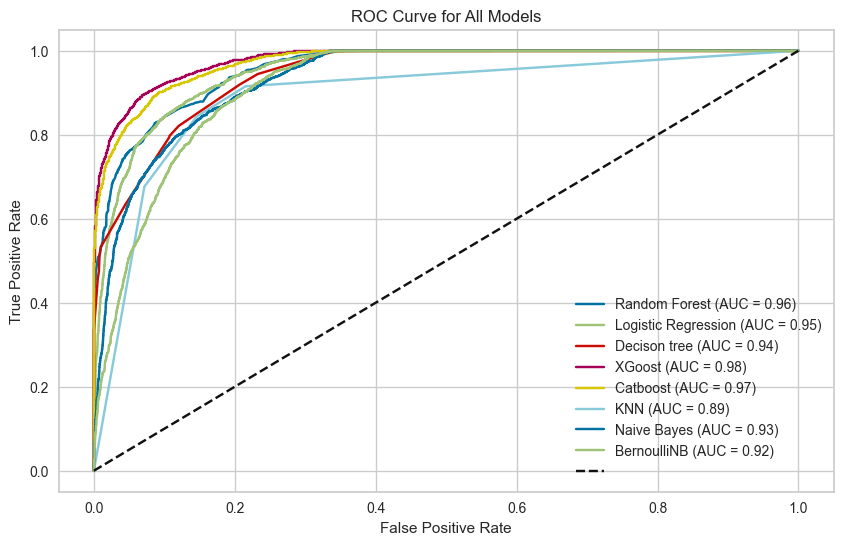

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

models = {
    "Random Forest": model8,
    "Logistic Regression": model1,
    'Decison tree':model7,
    'XGoost':XG,
    'Catboost':model_cat,
    'KNN':KNN,
    'Naive Bayes': model2,
    'BernoulliNB': model3,
    
    
}

plt.figure(figsize=(10, 6))

for name, model in models.items():
    y_probs = model.predict_proba(x_test)[:, 1]  
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', label=" ")

plt.title("ROC Curve for All Models")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

In [208]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report



#LightGBM
train_data = lgb.Dataset(x_train, label=y_train)
test_data = lgb.Dataset(x_test, label=y_test, reference=train_data)

#Focal Loss
params = {
    'objective': 'binary',          
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'learning_rate': 0.1,
    'num_leaves': 31,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': -1,
    # --- Focal Loss Parameters ---
    'focal_loss_alpha': 0.25,      
    'focal_loss_gamma': 2.0        
}

model6 = lgb.train(
    params,
    train_data,
    num_boost_round=100,
    valid_sets=[test_data],
    callbacks=[lgb.early_stopping(10)]
)

y_pred_proba = model6.predict(x_test)
y_pred = (y_pred_proba > 0.5).astype(int)

print(classification_report(y_test, y_pred))

Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.150564
              precision    recall  f1-score   support

           0       0.94      0.97      0.96      7000
           1       0.89      0.80      0.84      2000

    accuracy                           0.93      9000
   macro avg       0.92      0.89      0.90      9000
weighted avg       0.93      0.93      0.93      9000



# =============================================================================
# Deep Learning Models 
# =============================================================================
